In [1]:
import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import os

import kktk

import cellcharter

In [2]:
import squidpy as sq

In [3]:
import session_info
session_info.show()

In [4]:
sc.settings.set_figure_params(dpi=80)

# Function

In [5]:
import numpy as np
import pandas as pd
from scipy.stats import fisher_exact
from statsmodels.stats.multitest import multipletests

def enrichment_log2or_fisher(df_obs, celltype_col, cluster_col, pseudocount=0.5):
    """
    Returns:
      res_long: long-form table with count, log2_or, pval, qval
      counts: cluster x celltype count matrix
    """
    counts = pd.crosstab(df_obs[cluster_col], df_obs[celltype_col])  # clusters x celltypes
    N = counts.to_numpy().sum()

    out = []
    for cl in counts.index:
        row_sum = counts.loc[cl].sum()
        for ct in counts.columns:
            a = int(counts.loc[cl, ct])
            col_sum = int(counts[ct].sum())

            b = col_sum - a
            c = row_sum - a
            d = N - (a + b + c)

            # log2 OR with Haldane–Anscombe correction
            log2_or = np.log2(((a + pseudocount) * (d + pseudocount)) /
                              ((b + pseudocount) * (c + pseudocount)))

            # Fisher exact test (two-sided)
            _, p = fisher_exact([[a, b], [c, d]], alternative="two-sided")

            out.append((cl, ct, a, log2_or, p))

    res_long = pd.DataFrame(out, columns=["cluster", "celltype", "count", "log2_or", "pval"])
    res_long["qval"] = multipletests(res_long["pval"].values, method="fdr_bh")[1]
    return res_long, counts

import seaborn as sns
import matplotlib.pyplot as plt

def clustermap_log2or_with_positive_significance(
    res_long,
    q_thresh=0.05,
    figsize=(12, 10),
    clip_percentile=95,
    sig_marker="*",
    marker_size=10
):

    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt

    log2or = res_long.pivot(index="cluster", columns="celltype", values="log2_or")
    qmat   = res_long.pivot(index="cluster", columns="celltype", values="qval")

    # clip extremes for clean color scaling
    vmax = np.nanpercentile(np.abs(log2or.to_numpy()), clip_percentile)
    log2or_plot = log2or.clip(-vmax, vmax)
    
    plt.rcParams['axes.grid'] = False
    g = sns.clustermap(
        log2or_plot,
        cmap="vlag",
        center=0,
        linewidths=0.3,
        linecolor="white",
        figsize=figsize,
        cbar_kws={"label": "log2(odds ratio)"},
        dendrogram_ratio=0.02,
        cbar_pos=(-0.05, 0.8, 0.02, 0.15)
    )

    ax = g.ax_heatmap
    ax.set_xlabel("Cell type")
    ax.set_ylabel("Cluster")
    ax.set_title(f"log2(OR) enrichment (* = q<{q_thresh} & positive)")

    # get reordered indices after clustering
    row_order = g.dendrogram_row.reordered_ind
    col_order = g.dendrogram_col.reordered_ind

    log2or_ord = log2or.iloc[row_order, col_order]
    q_ord      = qmat.iloc[row_order, col_order]

    # overlay asterisk ONLY for positive & significant
    for i in range(log2or_ord.shape[0]):
        for j in range(log2or_ord.shape[1]):
            if (
                pd.notna(q_ord.iat[i, j])
                and q_ord.iat[i, j] < q_thresh
                and log2or_ord.iat[i, j] > 0
            ):
                ax.text(
                    j + 0.5,
                    i + 0.5,
                    sig_marker,
                    ha="center",
                    va="center",
                    fontsize=marker_size,
                    color="black"
                )

    plt.show()
    return g

# Variables

In [6]:
data_object_dir = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025'
path_adata = f'{data_object_dir}/all_b2c_cells_filtered_raw.h5ad' # use the object which contains all the qualified cells
adata_sub_dir = f'{data_object_dir}/cellcharter_cluster_subsets'

In [7]:
coarse_cluster_col = 'cluster_cellcharter_layer-0123_k-8'
fine_cluster_col = 'cluster_cellcharter_layer-0123_k-8' # identical k across all the coarse-cc-clusters

In [8]:
# cells for plotting
cells_plot = [
        'ArterialEndothelialCells',
     'AtrialCardiomyocytesLeft',
     'AtrialCardiomyocytesNeurotropic',
     'AtrialCardiomyocytesRight',
     'AtrialCardiomyocytesTransitional',
     'AtrioventricularNodePacemakerCells',
     'CoronaryCapillaryEndothelialCells',
     'CoronaryMuralCells',
     'DuctusArteriosusSmoothMuscleCells',
     'EndocardialCells',
     'EpicardiumDerivedCells',
     'Erythrocytes',
     'Fibroblasts',
     'FibroblastsCOL2A1pos',
     'FibroblastsPITX2pos',
     'GreatVesselSmoothMuscleCells',
     'InnateLymphoidCells',
     'LymphaticEndothelialCells',
     'MacrophagesCX3CR1pos',
     'MacrophagesLYVE1pos',
     'MesothelialEpicardialCells',
     'Monocytes',
     'NaturalKillerCells',
     'ParasympatheticNeurons',
     'SchwannCells',
     'SinoatrialNodePacemakerCellsHead',
     'SinoatrialNodePacemakerCellsTail',
     'SinusHornPacemakerCells',
     # 'SkeletalMuscleLike',
     'SympatheticNeurons',
     'ValveEndothelialCells',
     'ValveInterstitialCells',
     'VenousEndothelialCells',
     'VentricularCardiomyocytesCompact',
     'VentricularCardiomyocytesTrabeculated',
     'VentricularConductionSystemDistal',
     'VentricularConductionSystemProximal',
     # 'unclassified'
]

# Read in original adata

In [9]:
adata = sc.read_h5ad(path_adata)
adata

AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'scVI_latent_n-layers-3_leiden_0.2', 'scVI_latent_n-layers-3_leiden_0.3', 'scVI_latent_n-layers-3_leiden_0.4', 'scVI_latent_n-layers-3_leiden_0.5', 'scVI_latent_n-layers-3_leiden_0.8', 'scVI_latent_n-layers-3_leiden_1.0', 'scVI_latent_n-layers-3_leiden_1.5', 'scVI_latent_n-layers-3_leiden_2.0', 'scVI_latent_n-layers-3_leiden_3.0', 'scVI_latent_n-layers-3_leiden_4.0', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-sc

# Add cell charter cluster columns

In [14]:
# add coarse-grained cellcharter cluster
adata.obs['cc-clusters_coarse_grain'] = adata.obs[coarse_cluster_col].copy()

In [15]:
# add fine-grained clusters
adata.obs['cc-clusters_fine_grain'] = np.nan
adata_sub_files = sorted([x for x in os.listdir(adata_sub_dir) if x.endswith('.h5ad')])
for file in adata_sub_files:
    cluster_name = file.split('_lognorm')[0]
    print(cluster_name)
    adata_sub = sc.read_h5ad(f'{adata_sub_dir}/{file}',backed='r')
    # add clusters to original adata
    fine_clusters_arr = np.array(f'coarse-{cluster_name} | fine-cc_cluster'+adata_sub.obs[fine_cluster_col].astype('str'))
    adata.obs.loc[adata_sub.obs_names,'cc-clusters_fine_grain'] = fine_clusters_arr.copy()

cc_cluster0
cc_cluster1
cc_cluster2
cc_cluster3
cc_cluster4
cc_cluster5
cc_cluster6
cc_cluster7


# Plot enrichment of cell types across clusters

In [16]:
celltype_col = 'fine_grain_2Feb2026_mod'
cluster_col = 'cc-clusters_fine_grain'
df_obs = adata.obs.copy()
df_obs = df_obs[df_obs[celltype_col].isin(cells_plot)]
res, counts = enrichment_log2or_fisher(df_obs, celltype_col, cluster_col)

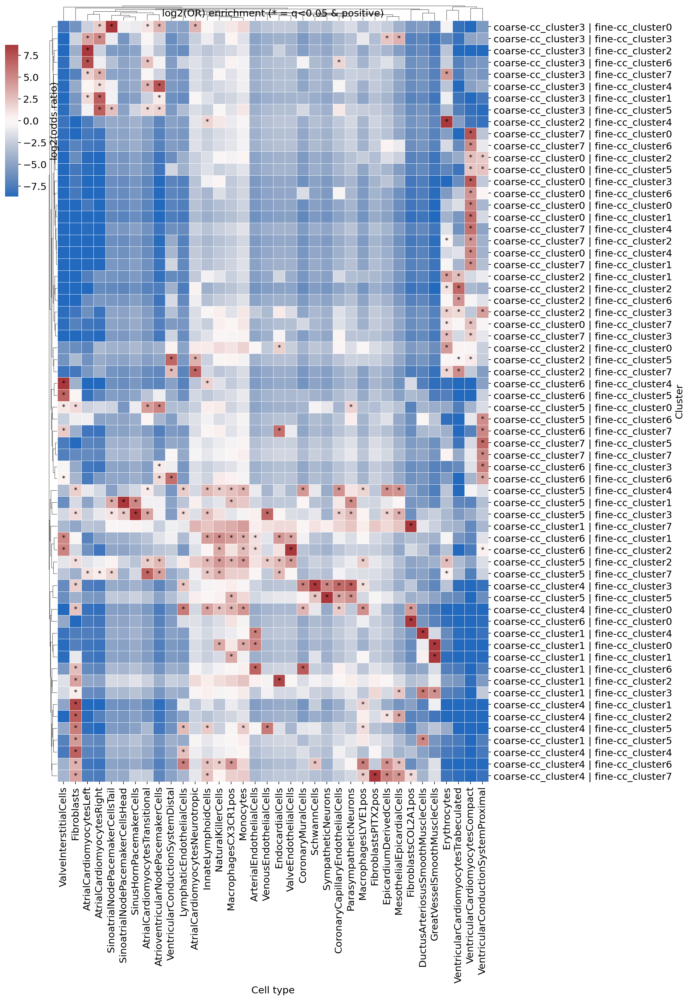

In [17]:
clustermap_log2or_with_positive_significance(
    res,
    q_thresh=0.05,
    figsize=(13,20),
    clip_percentile=95,
    sig_marker="*",      # use "•" for dots
    marker_size=10
)

# Annotation based on crietria

For each fine-grained niche:
   - Take the landmark cell types which has positive logOR & significance 
   - Temporarily annotate based on the celltype which has highest logOR

In [18]:
landmark_celltypes_mapping = {
     # 'ArterialEndothelialCells',
     'AtrialCardiomyocytesLeft': 'Atrium - Left',
     # 'AtrialCardiomyocytesNeurotropic',
     'AtrialCardiomyocytesRight': 'Atrium - Right',
     'AtrialCardiomyocytesTransitional': 'Atrium - Transitional',
     'AtrioventricularNodePacemakerCells': 'AVnode',
     'CoronaryCapillaryEndothelialCells': 'Coronary vessel',
     'CoronaryMuralCells': 'Coronary vessel',
     'DuctusArteriosusSmoothMuscleCells': 'Ductus arteriosus',
     'EndocardialCells': 'Endocardium',
     # 'EpicardiumDerivedCells',
     # 'Erythrocytes',
     # 'Fibroblasts',
     # 'FibroblastsCOL2A1pos',
     # 'FibroblastsPITX2pos',
     'GreatVesselSmoothMuscleCells':'Great vessel',
     # 'InnateLymphoidCells',
     # 'LymphaticEndothelialCells',
     # 'MacrophagesCX3CR1pos',
     # 'MacrophagesLYVE1pos',
     'MesothelialEpicardialCells': 'Epicardium',
     # 'Monocytes',
     # 'NaturalKillerCells',
     # 'ParasympatheticNeurons',
     # 'SchwannCells',
     'SinoatrialNodePacemakerCellsHead':'SAnode - Head',
     'SinoatrialNodePacemakerCellsTail':'SAnode - Tail',
     'SinusHornPacemakerCells':'Sinus horn',
     # 'SympatheticNeurons',
     'ValveEndothelialCells':'Valves',
     'ValveInterstitialCells':'Valves',
     # 'VenousEndothelialCells',
     'VentricularCardiomyocytesCompact':'Ventricle - Compact',
     'VentricularCardiomyocytesTrabeculated':'Ventricle - Trabeculated',
     'VentricularConductionSystemDistal':'VCS - Distal',
     'VentricularConductionSystemProximal':'VCS - Proximal'
}

In [19]:
q_thresh = 0.05
log2_or_thresh = 0

celltype_col = 'fine_grain_2Feb2026_mod'
cluster_col = 'cc-clusters_fine_grain'
df_obs = adata.obs.copy()
df_obs = df_obs[df_obs[celltype_col].isin(cells_plot)]
res, counts = enrichment_log2or_fisher(df_obs, celltype_col, cluster_col)

mask1 = res['qval']<q_thresh
mask2 = res['log2_or']>log2_or_thresh
res_sel = res[mask1&mask2]

cluster_annotation = {}
for cluster in set(res['cluster']):
    if cluster in list(res_sel['cluster']):
        df = res_sel[res_sel['cluster']==cluster].copy()
        df = df[df['celltype'].isin(landmark_celltypes_mapping.keys())]
        celltypes_sel = list(df[df['log2_or']== df['log2_or'].max()]['celltype'])
        if len(celltypes_sel)==1:
            cluster_annotation[cluster] = f'{cluster}: {landmark_celltypes_mapping[celltypes_sel[0]]}'
        elif len(celltypes_sel)==0:
            cluster_annotation[cluster] = f'{cluster}: no landmark cell types'
        elif len(celltypes_sel)>1:
            cluster_annotation[cluster] = f'{cluster}: multiple landmark cell types: {",".join(celltypes_sel)}'
    else:
        cluster_annotation[cluster] = f'{cluster}: no significantly enriched cell types'
cluster_annotation

{'coarse-cc_cluster3 | fine-cc_cluster5': 'coarse-cc_cluster3 | fine-cc_cluster5: Atrium - Right',
 'coarse-cc_cluster3 | fine-cc_cluster4': 'coarse-cc_cluster3 | fine-cc_cluster4: AVnode',
 'coarse-cc_cluster0 | fine-cc_cluster1': 'coarse-cc_cluster0 | fine-cc_cluster1: Ventricle - Compact',
 'coarse-cc_cluster3 | fine-cc_cluster0': 'coarse-cc_cluster3 | fine-cc_cluster0: SAnode - Tail',
 'coarse-cc_cluster3 | fine-cc_cluster7': 'coarse-cc_cluster3 | fine-cc_cluster7: Atrium - Right',
 'coarse-cc_cluster0 | fine-cc_cluster3': 'coarse-cc_cluster0 | fine-cc_cluster3: Ventricle - Compact',
 'coarse-cc_cluster7 | fine-cc_cluster1': 'coarse-cc_cluster7 | fine-cc_cluster1: Ventricle - Compact',
 'coarse-cc_cluster3 | fine-cc_cluster2': 'coarse-cc_cluster3 | fine-cc_cluster2: Atrium - Left',
 'coarse-cc_cluster5 | fine-cc_cluster2': 'coarse-cc_cluster5 | fine-cc_cluster2: Valves',
 'coarse-cc_cluster7 | fine-cc_cluster6': 'coarse-cc_cluster7 | fine-cc_cluster6: Ventricle - Compact',
 'coarse

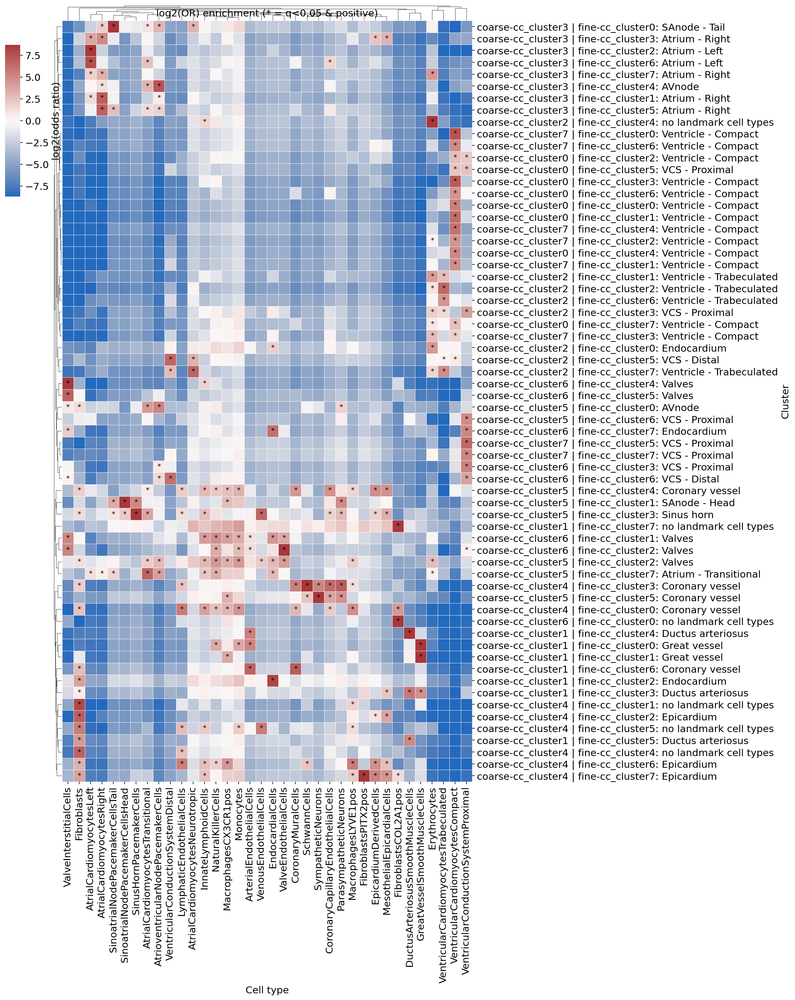

In [23]:
# checking
adata.obs['cellular_niche_tentative'] = adata.obs['cc-clusters_fine_grain'].astype('str').copy()
adata.obs.replace({'cellular_niche_tentative':cluster_annotation},inplace=True)

celltype_col = 'fine_grain_2Feb2026_mod'
cluster_col = 'cellular_niche_tentative'
df_obs = adata.obs.copy()
df_obs = df_obs[df_obs[celltype_col].isin(cells_plot)]
res, counts = enrichment_log2or_fisher(df_obs, celltype_col, cluster_col)

clustermap_log2or_with_positive_significance(
    res,
    q_thresh=0.05,
    figsize=(15,20),
    clip_percentile=95,
    sig_marker="*",      # use "•" for dots
    marker_size=10
)

In [21]:
set(adata.obs['cellular_niche_tentative'])

{'coarse-cc_cluster0 | fine-cc_cluster0: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster1: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster2: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster3: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster4: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster5: VCS - Proximal',
 'coarse-cc_cluster0 | fine-cc_cluster6: Ventricle - Compact',
 'coarse-cc_cluster0 | fine-cc_cluster7: Ventricle - Compact',
 'coarse-cc_cluster1 | fine-cc_cluster0: Great vessel',
 'coarse-cc_cluster1 | fine-cc_cluster1: Great vessel',
 'coarse-cc_cluster1 | fine-cc_cluster2: Endocardium',
 'coarse-cc_cluster1 | fine-cc_cluster3: Ductus arteriosus',
 'coarse-cc_cluster1 | fine-cc_cluster4: Ductus arteriosus',
 'coarse-cc_cluster1 | fine-cc_cluster5: Ductus arteriosus',
 'coarse-cc_cluster1 | fine-cc_cluster6: Coronary vessel',
 'coarse-cc_cluster1 | fine-cc_cluster7: no landmark cell types',
 'coarse-cc_cluster2 | fin

# Annotate - manual curation

In [35]:
adata.obs['cellular_niche_23Feb2026'] = adata.obs['cellular_niche_tentative'].astype('str').copy()
# manual curation
adata.obs.replace({'cellular_niche_23Feb2026':{
    'coarse-cc_cluster2 | fine-cc_cluster4: no landmark cell types':'coarse-cc_cluster2 | fine-cc_cluster4: Erythrocytes',
    'coarse-cc_cluster0 | fine-cc_cluster2: Ventricle - Compact':'coarse-cc_cluster0 | fine-cc_cluster2: VCS - Proximal',
    'coarse-cc_cluster2 | fine-cc_cluster7: Ventricle - Trabeculated':'coarse-cc_cluster2 | fine-cc_cluster7: VCS - Distal',
    'coarse-cc_cluster1 | fine-cc_cluster7: no landmark cell types':'coarse-cc_cluster1 | fine-cc_cluster7: COL2A1-high fibroblast ECM',
    'coarse-cc_cluster6 | fine-cc_cluster0: no landmark cell types':'coarse-cc_cluster6 | fine-cc_cluster0: COL2A1-high fibroblast ECM',
    'coarse-cc_cluster4 | fine-cc_cluster1: no landmark cell types':'coarse-cc_cluster4 | fine-cc_cluster1: Fibroblast - Immune',
    'coarse-cc_cluster4 | fine-cc_cluster5: no landmark cell types':'coarse-cc_cluster4 | fine-cc_cluster5: Fibroblast - Immune',
    'coarse-cc_cluster4 | fine-cc_cluster4: no landmark cell types':'coarse-cc_cluster4 | fine-cc_cluster4: Fibroblast - Immune',
    'coarse-cc_cluster3 | fine-cc_cluster3: Atrium - Right':'coarse-cc_cluster3 | fine-cc_cluster3: Epicardium - Myocardium',
    'coarse-cc_cluster5 | fine-cc_cluster4: Coronary vessel':'coarse-cc_cluster5 | fine-cc_cluster4: Epicardium - Immune',
    'coarse-cc_cluster4 | fine-cc_cluster2: Epicardium':'coarse-cc_cluster4 | fine-cc_cluster2: Epicardium - Immune',
    'coarse-cc_cluster4 | fine-cc_cluster6: Epicardium':'coarse-cc_cluster4 | fine-cc_cluster6: Epicardium - Immune',
    'coarse-cc_cluster4 | fine-cc_cluster7: Epicardium':'coarse-cc_cluster4 | fine-cc_cluster7: Epicardium - Immune',
    'coarse-cc_cluster2 | fine-cc_cluster0: Endocardium':'coarse-cc_cluster2 | fine-cc_cluster0: Endocardium - Ventricular',
    'coarse-cc_cluster6 | fine-cc_cluster7: Endocardium':'coarse-cc_cluster6 | fine-cc_cluster7: Endocardium - Ventricular',
    'coarse-cc_cluster1 | fine-cc_cluster2: Endocardium':'coarse-cc_cluster1 | fine-cc_cluster2: Fibroblast - Immune'
}},inplace = True)
print(any(['no landmark cell types' in x for x in adata.obs['cellular_niche_tentative']]))
print(any(['no landmark cell types' in x for x in adata.obs['cellular_niche_23Feb2026']]))

True
False


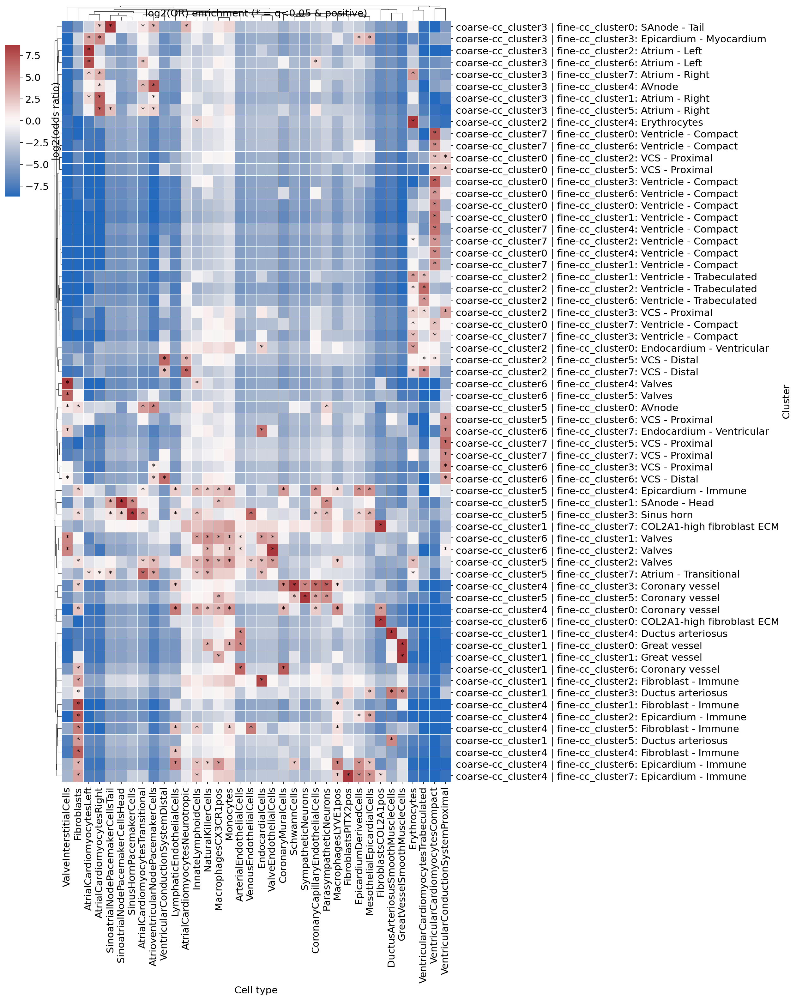

In [36]:
celltype_col = 'fine_grain_2Feb2026_mod'
cluster_col = 'cellular_niche_23Feb2026'
df_obs = adata.obs.copy()
df_obs = df_obs[df_obs[celltype_col].isin(cells_plot)]
res, counts = enrichment_log2or_fisher(df_obs, celltype_col, cluster_col)

clustermap_log2or_with_positive_significance(
    res,
    q_thresh=0.05,
    figsize=(15,20),
    clip_percentile=95,
    sig_marker="*",      # use "•" for dots
    marker_size=10
)

In [37]:
# update cellular niche labels
adata.obs['cellular_niche_23Feb2026'] = [x.split(': ')[1] for x in adata.obs['cellular_niche_23Feb2026']]
adata.obs['cellular_niche_23Feb2026'].value_counts()

cellular_niche_23Feb2026
Ventricle - Compact           62662
VCS - Proximal                19396
Ventricle - Trabeculated      18260
Valves                        17765
Fibroblast - Immune           14031
Epicardium - Immune           13466
VCS - Distal                  10125
Atrium - Right                 9863
Coronary vessel                7395
AVnode                         7185
Atrium - Left                  6116
Erythrocytes                   6018
Great vessel                   5304
Endocardium - Ventricular      5145
Epicardium - Myocardium        4694
Ductus arteriosus              4409
COL2A1-high fibroblast ECM     3166
Sinus horn                     3040
Atrium - Transitional          2529
SAnode - Tail                  2284
SAnode - Head                  2244
Name: count, dtype: int64

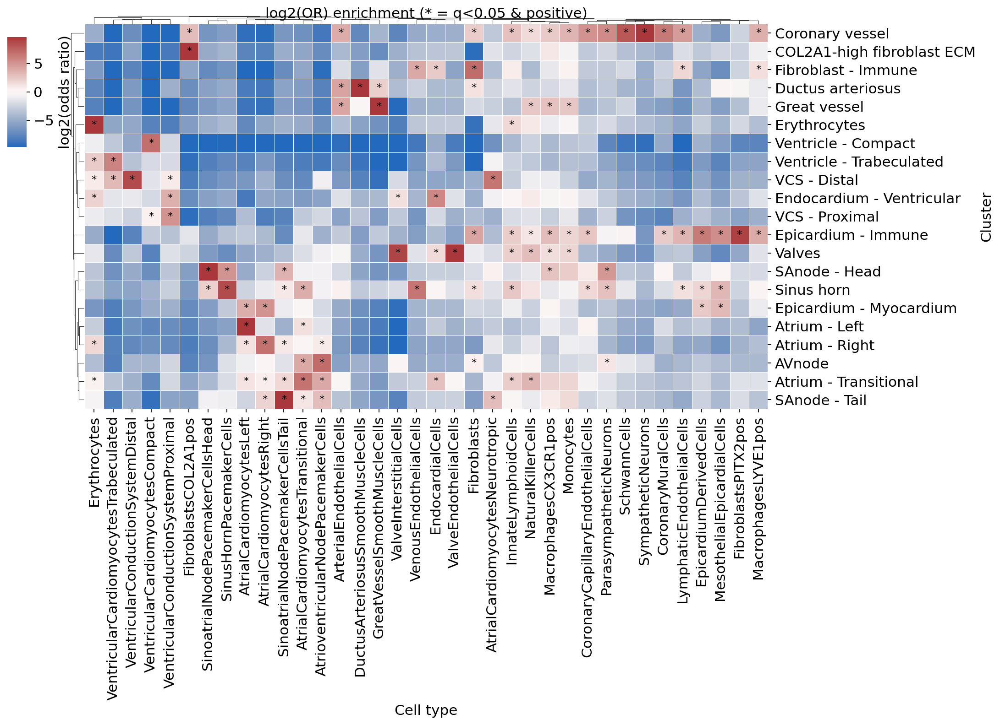

In [38]:
celltype_col = 'fine_grain_2Feb2026_mod'
cluster_col = 'cellular_niche_23Feb2026'
df_obs = adata.obs.copy()
df_obs = df_obs[df_obs[celltype_col].isin(cells_plot)]
res, counts = enrichment_log2or_fisher(df_obs, celltype_col, cluster_col)

clustermap_log2or_with_positive_significance(
    res,
    q_thresh=0.05,
    figsize=(13,10),
    clip_percentile=95,
    sig_marker="*",      # use "•" for dots
    marker_size=10
)

# Save

In [39]:
print(adata.X.data[:10])
adata

[1. 1. 1. 1. 1. 1. 1. 2. 1. 1.]


AnnData object with n_obs × n_vars = 225097 × 18085
    obs: 'object_id', 'bin_count', 'array_row', 'array_col', 'labels_joint_source', 'in_tissue_manual', 'library', 'donor_section_ID', 'per-frame_donorIDs', 'donor', 'CS', 'est_CS', 'GA', 'PCW', 'section_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'library_donor', 'n_genes', 'scVI_latent_n-layers-3_leiden_0.2', 'scVI_latent_n-layers-3_leiden_0.3', 'scVI_latent_n-layers-3_leiden_0.4', 'scVI_latent_n-layers-3_leiden_0.5', 'scVI_latent_n-layers-3_leiden_0.8', 'scVI_latent_n-layers-3_leiden_1.0', 'scVI_latent_n-layers-3_leiden_1.5', 'scVI_latent_n-layers-3_leiden_2.0', 'scVI_latent_n-layers-3_leiden_3.0', 'scVI_latent_n-layers-3_leiden_4.0', 'coarse_grain_pre', 'coarse_grain_pre_2', 'coarse_grain_tacco_ref-hd-sc

In [40]:
adata.write(path_adata)
print(path_adata)

/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/all_b2c_cells_filtered_raw.h5ad


In [41]:
# to check labels from TissueTypist
ad = sc.read_h5ad('/rfs/project/rfs-iCNyzSAaucw/kk837/notebooks/Foetal/TissueTypist/CamU/tissuetypist_package/visiumsd_oct_raw.h5ad',
                 backed='r')
set(ad.obs['annotation_final_mod'])

{'AV ring',
 'AVnode',
 'Adventitia - GV',
 'Atrium',
 'Coronary vessel',
 'Ductus arteriosus',
 'Endocardial cusion',
 'Endocardium - Atrial',
 'Endocardium - Ventricular',
 'Epicardium',
 'Great vessel',
 'SAnode',
 'VCS - Distal',
 'VCS - Proximal',
 'Valves',
 'Ventricle - Compact',
 'Ventricle - Trabeculated',
 'unassigned'}

# Plot on sections

In [42]:
# prepare function
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot(
    adata,
    group: str,                    # value to highlight
    group_key: str,                # column in adata.obs
    section_key: str = "section_ID",
    row_key: str = "array_row",
    col_key: str = "array_col",
    section_list=None,
    ncols: int = 4,
    s: float = 3,
    palette=None,
    invert_y: bool = False,
    legend_loc: str = "center left",
    legend_bbox=(1.02, 0.5),
    figsize_per_panel=(3.6, 3.2),
    show: bool = True,
    return_fig: bool = False,
    show_legend: bool = True,
):
    coord_df = adata.obs[[section_key, row_key, col_key, group_key]].copy()

    if section_list is None:
        section_list = sorted(coord_df[section_key].unique().tolist())
    else:
        section_list = list(section_list)

    if palette is None:
        palette = {"others": "lightgrey", group: "red"}

    n = len(section_list)
    if n == 0:
        raise ValueError("No sections found (section_list is empty).")

    nrows = math.ceil(n / ncols)

    fig_w = figsize_per_panel[0] * ncols
    fig_h = figsize_per_panel[1] * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), squeeze=False)
    axes_flat = axes.ravel()

    # Precompute hit coordinates
    hits = coord_df.loc[
        coord_df[group_key] == group,
        [section_key, row_key, col_key]
    ].drop_duplicates()

    legend_handles = None
    legend_labels = None

    for i, section_id in enumerate(section_list):
        ax = axes_flat[i]

        df_full = coord_df.loc[
            coord_df[section_key] == section_id,
            [section_key, row_key, col_key]
        ].copy()

        # Default label
        df_full["__highlight__"] = "others"

        df_hits = hits.loc[hits[section_key] == section_id]

        if len(df_hits) > 0:
            key_cols = [section_key, row_key, col_key]
            hit_key = pd.MultiIndex.from_frame(df_hits[key_cols])
            full_key = pd.MultiIndex.from_frame(df_full[key_cols])
            df_full.loc[full_key.isin(hit_key), "__highlight__"] = group

        want_legend_here = (i == 0) and show_legend

        sns.scatterplot(
            ax=ax,
            data=df_full,
            x=col_key,
            y=row_key,
            hue="__highlight__",
            palette=palette,
            s=s,
            linewidth=0,
            legend=want_legend_here,
        )

        ax.grid(False)
        ax.set_title(str(section_id))

        if invert_y:
            ax.invert_yaxis()

        if want_legend_here:
            leg = ax.get_legend()
            if leg is not None:
                legend_handles, legend_labels = ax.get_legend_handles_labels()
                leg.remove()

    # Hide unused axes
    for j in range(n, nrows * ncols):
        axes_flat[j].set_visible(False)

    if show_legend and legend_handles is not None and legend_labels is not None:
        fig.legend(
            legend_handles,
            legend_labels,
            loc=legend_loc,
            bbox_to_anchor=legend_bbox,
            frameon=False,
        )
    fig.suptitle(f'### {group} ###', x=0.4, y=0.88)
    plt.tight_layout(rect=(0, 0, 0.86, 0.95))

    if show:
        plt.show()

    if return_fig:
        return fig
    return None

In [ ]:
'''
path_adata = '/rfs/project/rfs-iCNyzSAaucw/kk837/data_objects/Foetal/VisiumHD/Revision_Oct2025/all_b2c_cells_filtered_raw.h5ad'
adata = sc.read_h5ad(path_adata)
adata
'''

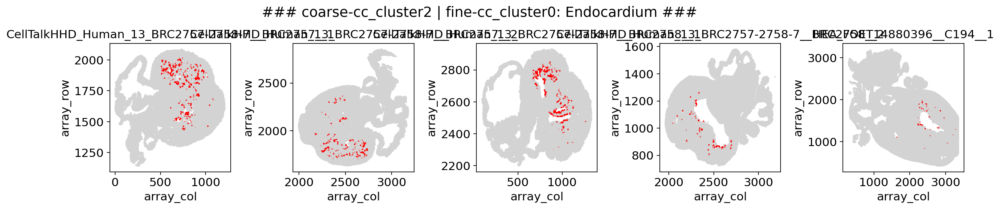

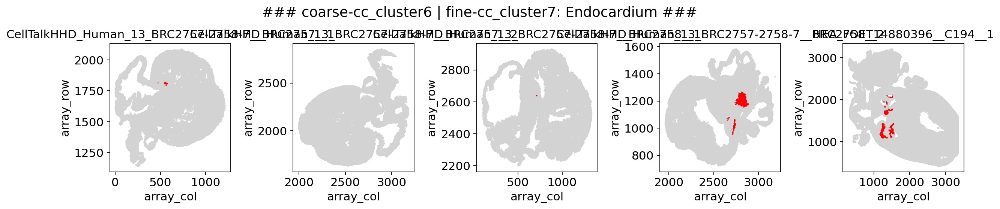

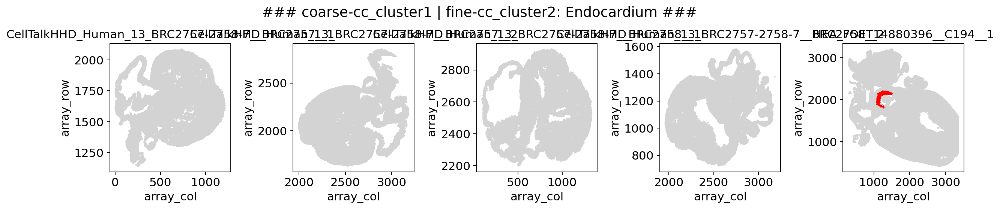

In [43]:
for group in [
    'coarse-cc_cluster2 | fine-cc_cluster0: Endocardium',
    'coarse-cc_cluster6 | fine-cc_cluster7: Endocardium',
    'coarse-cc_cluster1 | fine-cc_cluster2: Endocardium'
]:
    plot(adata, group=group, group_key='cellular_niche_tentative', 
         ncols=5, figsize_per_panel=(3.6, 4), show_legend=False)

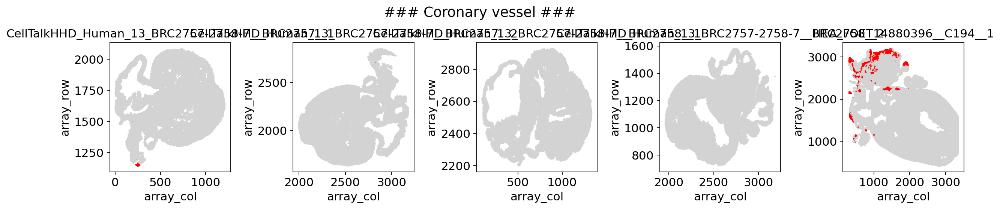

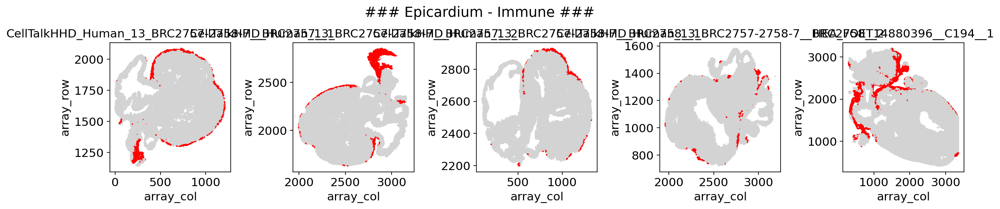

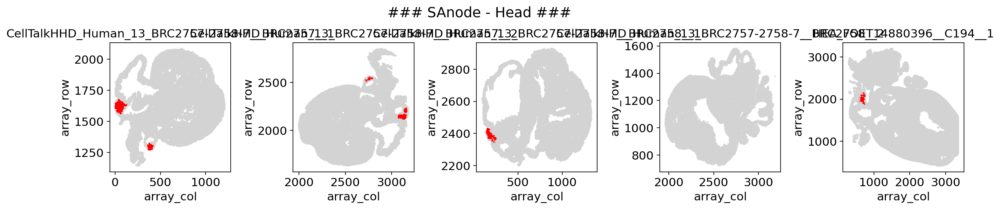

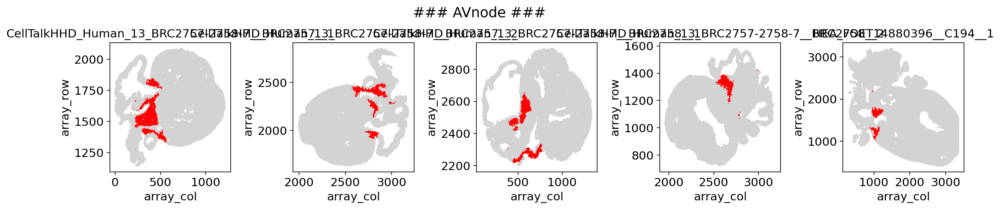

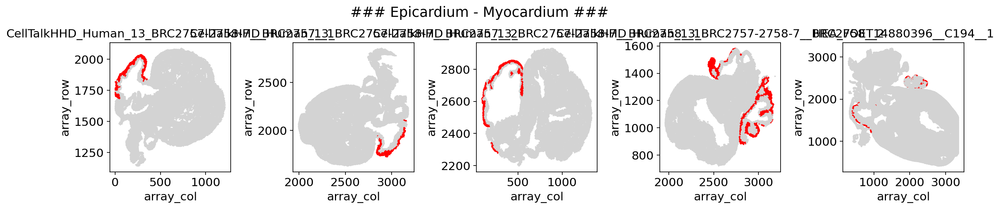

...

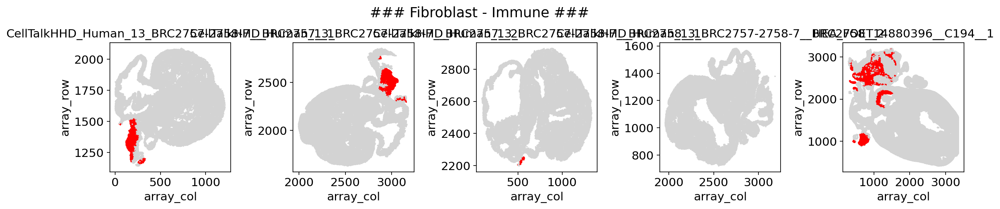

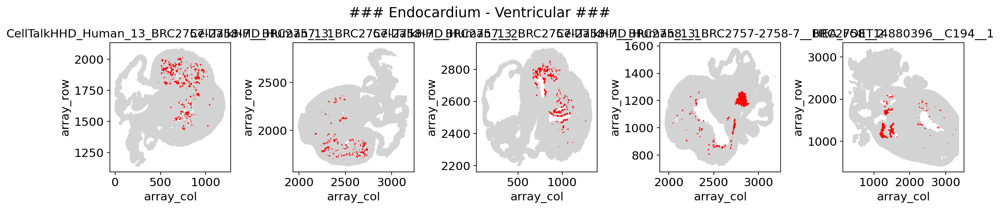

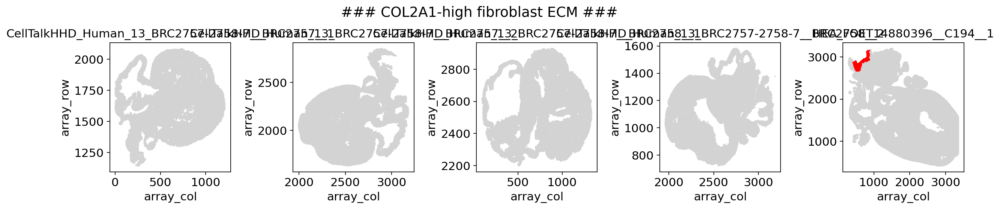

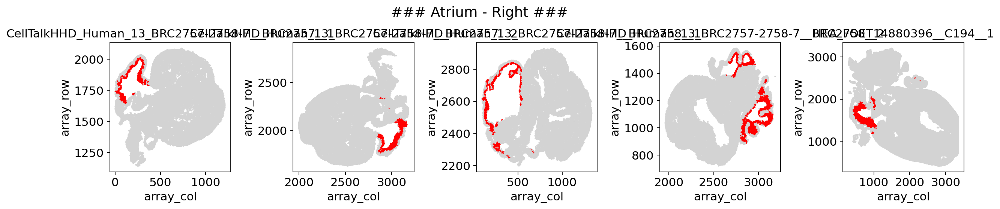

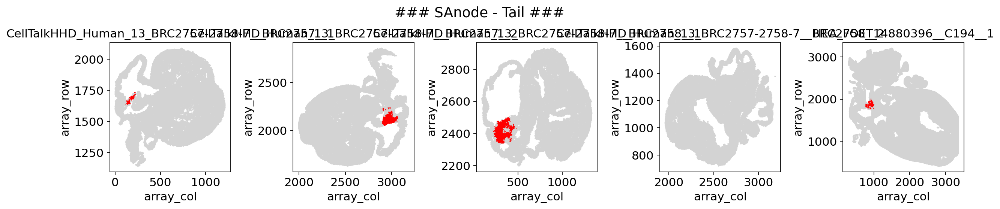

In [44]:
for group in set(adata.obs['cellular_niche_23Feb2026']):
    plot(adata, group=group, group_key='cellular_niche_23Feb2026', 
         ncols=5, figsize_per_panel=(3.6, 4), show_legend=False)

Next move:
- TissueTypist